In [5]:
import pandas as pd

URL = r"data301/course-project-group_6012/data/raw/UniversitiesDataSet.csv" #change URL depending on your file setup
URL = r"C:\Users\Amritpal Aujla\data301\course-project-group_6012\data\raw\UniversitiesDataSet.csv"

def load_and_process(URL):
    
    df = pd.read_csv(URL)
    df = df.iloc[200:,].reset_index(drop=True) #removing data from 2012 and 2013 - aka first 200 rows#
    score_sum_2014 = df[df['year']==2014]['score'].sum()
    score_sum_2015 = df[df['year']==2015]['score'].sum()
    df["Score - Avg"] = df["score"] #create new column
    for i in range(len(df)): #editing score - avg column
        if df.iloc[i,13] == "2014":
            df.iloc[i,14] = df.iloc[i,12] - (score_sum_2014/1000)
        else:
            df.iloc[i,14] = df.iloc[i,12] - (score_sum_2015/1000)
    def highlight_cols(x): #highlighting important columns
        df = x.copy() # copy new df 
        df.loc[:, :] = 'background-color: white'  # change background to white
        df[['world_rank', 'alumni_employment']] = 'background-color: yellow' # change world rank and alumni employment column to yellow
        return df  # return new df
    display(df.style.apply(highlight_cols, axis = None))
    
load_and_process(URL) #calling function

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv(r"C:\Users\Amritpal Aujla\data301\course-project-group_6012\data\raw\UniversitiesDataSet.csv")

In [8]:
df.shape
df.head()
df.columns.tolist() # all the columns

['world_rank',
 'institution',
 'country',
 'national_rank',
 'quality_of_education',
 'alumni_employment',
 'quality_of_faculty',
 'publications',
 'influence',
 'citations',
 'broad_impact',
 'patents',
 'score',
 'year']

In [9]:
df.dropna() # getting rid of nan rows if any
df.reset_index(drop=True) # reseting index; easier for readability

,world_rank,institution,country,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,broad_impact,patents,score,year
0,1,Harvard University,USA,1,7,9,1,1,1,1,NaN,5,100.00,2012
1,2,Massachusetts Institute of Technology,USA,2,9,17,3,12,4,4,NaN,1,91.67,2012
2,3,Stanford University,USA,3,17,11,5,4,2,2,NaN,15,89.50,2012
3,4,University of Cambridge,United Kingdom,1,10,24,4,16,16,11,NaN,50,86.17,2012
4,5,California Institute of Technology,USA,4,2,29,7,37,22,22,NaN,18,85.21,2012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,996,University of the Algarve,Portugal,7,367,567,218,926,845,812,969.0,816,44.03,2015
2196,997,Alexandria University,Egypt,4,236,566,218,997,908,645,981.0,871,44.03,2015
2197,998,Federal University of Ceará,Brazil,18,367,549,218,830,823,812,975.0,824,44.03,2015
2198,999,University of A Coruña,Spain,40,367,567,218,886,974,812,975.0,651,44.02,2015


In [10]:
df.describe(include= np.number).T # description of the columns numerically

,count,mean,std,min,25%,50%,75%,max
world_rank,2200.0,459.590909,304.320363,1.00,175.75,450.5,725.250,1000.0
national_rank,2200.0,40.278182,51.740870,1.00,6.00,21.0,49.000,229.0
quality_of_education,2200.0,275.100455,121.935100,1.00,175.75,355.0,367.000,367.0
alumni_employment,2200.0,357.116818,186.779252,1.00,175.75,450.5,478.000,567.0
quality_of_faculty,2200.0,178.888182,64.050885,1.00,175.75,210.0,218.000,218.0
publications,2200.0,459.908636,303.760352,1.00,175.75,450.5,725.000,1000.0
influence,2200.0,459.797727,303.331822,1.00,175.75,450.5,725.250,991.0
citations,2200.0,413.417273,264.366549,1.00,161.00,406.0,645.000,812.0
broad_impact,2000.0,496.699500,286.919755,1.00,250.50,496.0,741.000,1000.0
patents,2200.0,433.346364,273.996525,1.00,170.75,426.0,714.250,871.0


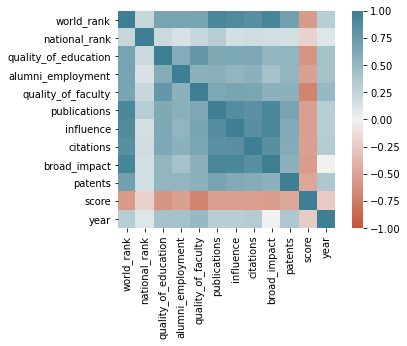

In [11]:
corr = df.corr()  # to see correlation between variables
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

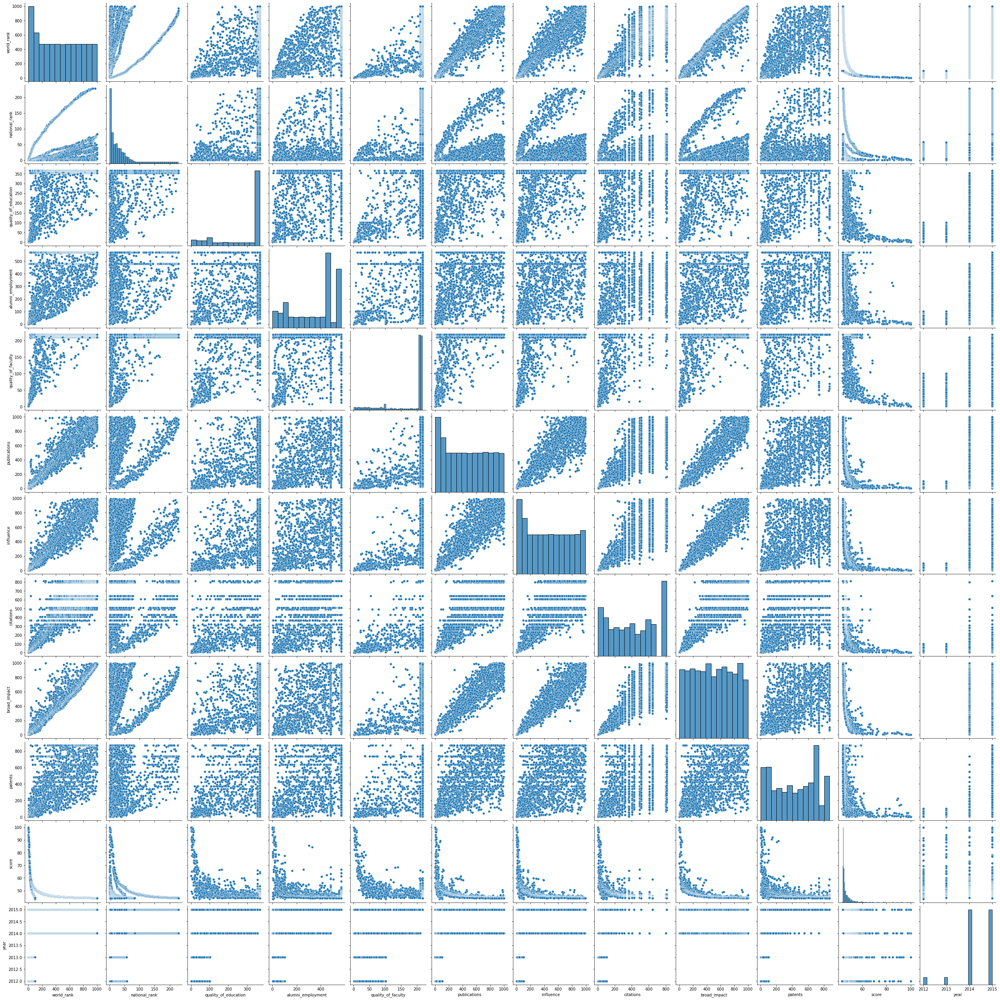

In [12]:
sns.pairplot(df, height= 3) # plotting each column with each column in various ways.. not too helpul but nice as an overview

<AxesSubplot:xlabel='quality_of_education', ylabel='world_rank'>

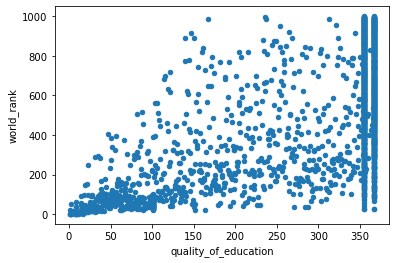

In [13]:
# now lets see if we can find anything between quality of education and world ranking
df.plot(kind='scatter', x='quality_of_education', y='world_rank')
# looks like there is some pattern to the plot...

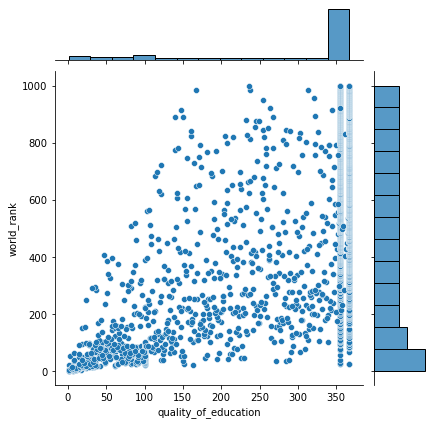

In [14]:
sns.jointplot(x='quality_of_education', y='world_rank', data= df)
# here we can see a significant increase in quality of education when world rank is closer to 1

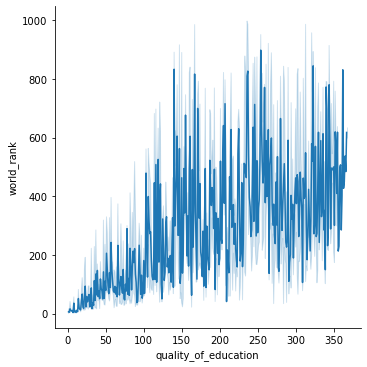

In [24]:
sns.relplot(x="quality_of_education", y="world_rank", kind="line", data=df) # here we can see the dots connected

<AxesSubplot:>

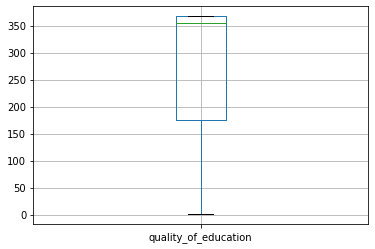

In [37]:
df.boxplot('quality_of_education')
# here are the boxlots of each column 

<AxesSubplot:>

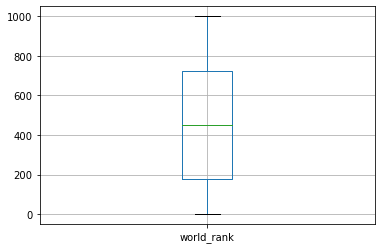

In [38]:
df.boxplot('world_rank')

<AxesSubplot:xlabel='quality_of_education', ylabel='world_rank'>

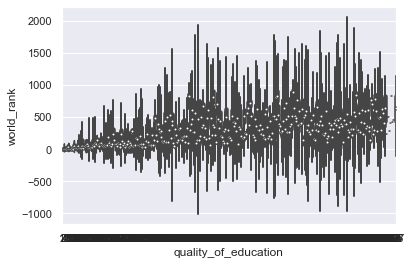

In [42]:
sns.set_theme(style="darkgrid", font_scale=1)
sns.violinplot(x='quality_of_education', y='world_rank', data= df)
# this doesnt seem to very helpful in our comparison

<AxesSubplot:xlabel='quality_of_education', ylabel='world_rank'>

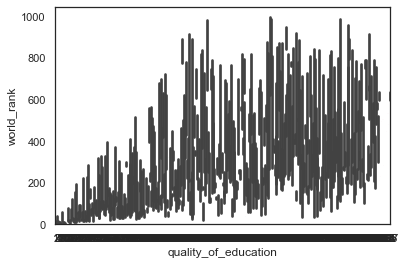

In [46]:
sns.set_theme(style="white", font_scale=1)
sns.barplot(x='quality_of_education', y='world_rank', data= df)
# this seems similar to regplot but less helpful